# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 4 threads 😎


In [2]:
# using Pkg

# Pkg.activate("C:\\Users\\julia\\OneDrive\\Escritorio\\phd\\Bacteria_ABM\\ABM_CBM")

# # Actualiza los registros (por si acaso)
# Pkg.Registry.update()

# # Reconstruye TODO a partir del Project.toml
# Pkg.instantiate()

# # Que resuelva dependencias y precompile
# Pkg.resolve()
# Pkg.precompile()


In [3]:
import Pkg

# Activa el entorno del proyecto
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")

Pkg.activate("/home/julia/Escritorio/Projects/Pushing/ABM_CBM")
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")


# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `~/Escritorio/Projects/Pushing/ABM_CBM`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Project.toml`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Manifest.toml`
Precompiling packages...
  12878.1 ms  ? CellBasedModels
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA /home/julia/.julia/packages/CUDA/jdJ7Z/lib/cudadrv/version.jl:82


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [4]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij
            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [5]:
com = Community(rod2D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.99      



com.x = 0
com.y = 0
com.theta = 0;


In [6]:
com.N

30

In [7]:
for i in 1:com.N
    com.theta[i] = rand() * 2π
    com.x[i] = rand()*10-5
    com.y[i] = rand()*10-5
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [8]:
com.theta[1]=20

20

In [9]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

In [10]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

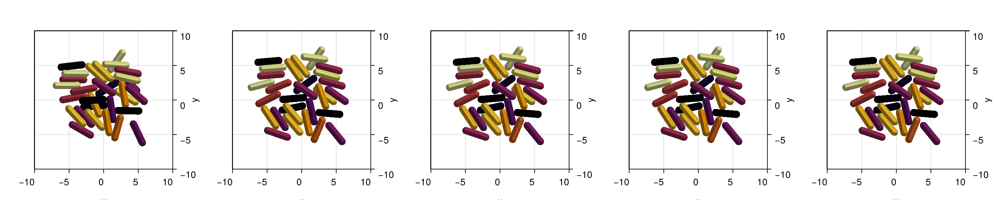

CairoMakie.Screen{IMAGE}


In [11]:
fig = Figure(size=(1500,300))

for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:theta],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [12]:

function log_community_state(parameters::OrderedDict, t::Int, path::String )
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String )
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 1 method)

In [13]:
function plotAgents3D!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, kargs...)
    # Recomendado: en tu Axis3 usa aspect=:data para evitar distorsión de ejes
    # ej.: ax = Axis3(fig[1,1]; aspect=:data)

    for (xi, yi, zi, di, li, thetai, phii, pi) in zip(x, y, z, d, l, theta, phi, p)
        # Dirección unitaria u(θ,φ)
        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        # Polos (extremos)
        x_plus  = xi + 0.5 * li * ux
        y_plus  = yi + 0.5 * li * uy
        z_plus  = zi + 0.5 * li * uz

        x_minus = xi - 0.5 * li * ux
        y_minus = yi - 0.5 * li * uy
        z_minus = zi - 0.5 * li * uz

        r = Float32(di/2)

        # Color: usa tu escalar 'pi' con colormap (fija un rango 0..1; ajusta si necesitas)
        colorrange = (0.0, 1.0)
        # Cilindro que UNE los polos (Makie lo orienta solo con p1->p2)


        # Esferas en los polos
        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Cylinder(
            Point3f(x_minus, y_minus, z_minus),
            Point3f(x_plus,  y_plus,  z_plus),
            r);
            color=pi, colormap=colormap, colorrange=colorrange, kargs...)


    end
    return
end


plotAgents3D! (generic function with 1 method)

In [14]:
# using GeometryBasics, Makie

view_dir(az, el) = Vec3f(cos(az)*cos(el), sin(az)*cos(el), sin(el))

function painter_perm(ax::Axis3, x, y, z)
    az = ax.azimuth[]; el = ax.elevation[]
    v  = view_dir(az, el)
    depths = x .* v[1] .+ y .* v[2] .+ z .* v[3]
    sortperm(depths; rev=false)  # far → near (lejos → cerca)
end

function plotAgents3D_auto!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)

        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


function plotAgents3Drod!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)


        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


plotAgents3Drod! (generic function with 1 method)

# Terracing


In [15]:
@inline function rod_poles3d_ordered(x,y,z,l,theta,phi)
    ux,uy,uz = rod_dir3d(theta, phi)
    hx,hy,hz = 0.5l*ux, 0.5l*uy, 0.5l*uz
    return (x+hx, y+hy, z+hz), (x-hx, y-hy, z-hz)  # (+, −)
end

rod_poles3d_ordered (generic function with 1 method)

In [16]:
@inline function rod_dir3d(theta, phi)
    cx = cos(theta); sx = sin(theta)
    cp = cos(phi);   sp = sin(phi)
    return (cx*cp, sx*cp, sp)               # u = (cosθ cosφ, sinθ cosφ, sinφ)
end


rod_dir3d (generic function with 1 method)

In [17]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :V => Float64,

        ),    #Local Interaction Parameters

    model = Dict(
            :Ebb =>Float64,
            :eta =>Float64,
            :eps =>Float64,
            :gamma =>Float64,
            :lMax => Float64,
            :σlTarget => Float64,
            :Ebv => Float64,
            :g => Float64,
            :h0 => Float64,
            :Ebp => Float64,
            :alpha_HP =>Float64,
            :K_HP =>Float64,
            :D_HP =>Float64,
            :Kc =>Float64,
            :beta_c =>Float64,
            :D_c =>Float64,
            :c0 =>Float64,
            :gamma_c => Float64,
            :eps_cs =>Float64,
            :gamma_cs =>Float64,
            :D_PGA =>Float64,
            :alpha_PGA =>Float64,
            :KpqC =>Float64,
            :delta_PGA =>Float64,
            :alpha_PhrC =>Float64,
            :alpha_PhrF =>Float64,
            :D_PhrC =>Float64,
            :D_PhrF =>Float64,
            :delta_PhrC =>Float64,
            :delta_PhrF =>Float64,
            :npqC => Int,
            :alpha_V => Float64,
            :delta_V => Float64,
            :beta_V => Float64,
            :KVc => Float64,
            :nV => Int,
            :npc => Int,
            :growth=>Float64,
            :Kpc => Float64,
            :v => Float64,
            :KpqF => Float64,
            :npqF =>Int,



        ),        #Global parameters

    medium = Dict(
            :HPad => Float64,
            :PPad => Float64,
            :c => Float64,
            :PGA => Float64,
            :Hx => Float64,
            :Hy => Float64,
            :PhrF => Float64,
        ),

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 

        
        hPad = HPad

        hbac = exp(2*(hPad-z-d/2))
        if hPad>z+d/2
            cbac=c*exp(-gamma_c*(hPad-z-d/2))
            
        else
            cbac=c
        end
        
        dt(l) = l*growth*cbac/(Kc+cbac)
        dt(V)= alpha_V - delta_V*V + beta_V*(hbac)^nV/((KVc)^nV+(hbac)^nV)

        
        

        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d_asym(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, Ebb, 5)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi

   
            
        end

        

        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateAttraction_rods_yukawa3d(x,y,z,d,l,theta,phi, 
            eta, eps_cs,gamma_cs)

                    #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   
        
        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateRepulsion_rods3d(x,y,z,d,l,theta,phi, 
            eta, Ebv)

        #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   


        fy += -v*Hy/(eta*(l+d))
        fx += -v*Hx/(eta*(l+d))


        Fijx = 0.0; Fijy = 0.0; Fijz = 0.0; Wijtheta=0.0; Wijphi=0.0


         # orientación del rod (tu convención)
        ux =  cos(theta)*cos(phi)
        uy =  sin(theta)*cos(phi)
        uz =  sin(phi)

        # grid spacing
        hx = (simBox[1,2] - simBox[1,1]) / NMedium[1]
        hy = (simBox[2,2] - simBox[2,1]) / NMedium[2]
        Δs_eff = 0.5*min(hx, hy)  # para no saltar celdas


        # recorrer s en [-l/2, l/2]
        K = max(2, ceil(Int, l / Δs_eff))  # aseguras al menos 2
        for s in LinRange(-l/2, l/2, K)
            # punto en el rod
            xp = x + s*ux
            yp = y + s*uy
            zp = z + s*uz

            # celda del pad
            idx = Int(floor(Int, xp/(simBox[1,2]-simBox[1,1])*NMedium[1]) + NMedium[1]/2)
            if mod(xp, (simBox[1,2]-simBox[1,1])/NMedium[1])>0
                idx += 1
            end
            idy = Int(floor(Int, yp/(simBox[2,2]-simBox[2,1])*NMedium[2])+ NMedium[2]/2)
            if mod(yp, (simBox[2,2]-simBox[2,1])/NMedium[2])>0
                idy += 1
            end
            
            # h local del pad (tu altura / “a” local)
            hPad = com.HPad[idx, idy, 1]

            if hPad<zp+d/2
                # fuerza en ese punto (tu función)
                Fx, Fy, Fz, Wθ, Wφ = CBMModels.padRepulsion_rods_point_3d(
                    x, y, z,  # CM bacteria
                    xp, yp, zp,  # punto sobre el rod
                    d, l, theta, phi,
                    eta, Ebp, hPad
                )

                # acumula bacteria
                Fijx += Fx; Fijy += Fy; Fijz += Fz
                Wijtheta += Wθ; Wijphi += Wφ
                com.PPad[idx, idy, 1] += -Fz*eta*(l+d)
            end

        end

        
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   


        ww1 = CBMDistributions.uniform(-1,1)*10^(-6)
        ww2 = CBMDistributions.uniform(-1,1)*10^(-6)

        #Equations
        dt(x) =  fx +ww1
        dt(y) =  fy +ww2
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
           

            # Dirección 3D de la varilla (unitaria)
            ux = cos(theta)*cos(phi)
            uy = sin(theta)*cos(phi)
            uz = sin(phi)

            # === Hija A (delantera, +u) ===
            @addAgent(
                x = x + (l+d)/4 * ux,
                y = y + (l+d)/4 * uy,
                z = z + (l+d)/4 * uz,
                l = (l-d)/2,
                # Wtheta = ww1,
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # === Hija B (trasera, −u) ===
            @addAgent(
                x = x - (l+d)/4 * ux,
                y = y - (l+d)/4 * uy,
                z = z - (l+d)/4 * uz,
                l = (l-d)/2,
                # Wtheta = ww1,
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # Elimina célula madre
            @removeAgent()
        end


        
        hPad = HPad
        hbac = c*exp(4*(hPad-z-d/2))
        if hPad >z+d/2
            cbac =c*exp(-gamma_c*(hPad-z-d/2))
        else
            cbac = c
        end
        c += (-l*beta_c*cbac/(Kc+cbac))*dt


        PhrF += (alpha_PhrF)*dt
        PGA += (alpha_PGA*PhrF^npqF/(PhrF^npqF+KpqF^npqF))*dt
        
    end,

    mediumODE=quote 

            
        if @mediumBorder(1,-1) 
            HPad = h0
            c = c[2,i2_]
            PhrF= PhrF[2,i2_]
            PGA=0
        elseif @mediumBorder(1, 1)
            HPad = h0
            c = c[end-1,i2_]
            PhrF= PhrF[end-1,i2_]
            PGA=0

        elseif @mediumBorder(2,-1)
            HPad = h0
            c = c[i1_,2]
            PhrF= PhrF[i1_,2]
            PGA=0

        elseif @mediumBorder(2, 1)
            HPad = h0
            c = c[i1_,end-1]
            PhrF= PhrF[i1_,end-1]
            PGA=0

        else
            dt(HPad) = alpha_HP*PPad - K_HP*(HPad-h0) + D_HP*(@∂2(1,HPad)+@∂2(2,HPad))
            dt(c) =D_c*(@∂2(1,c)+@∂2(2,c))
            dt(PGA) = D_PGA*(@∂2(1,PGA)+@∂2(2,PGA)) - delta_PGA*PGA 
            dt(PhrF) = D_PhrF*(@∂2(1,PhrF)+@∂2(2,PhrF)) - delta_PhrF*PhrF

            Hx = @∂(1,PGA) 
            Hy = @∂(2,PGA)
            
        end
    end,
    # neighborsAlg=CBMNeighbors.VerletDisplacement(skin=4.0, nMaxNeighbors=500),
    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=10),
    mediumAlg=DifferentialEquations.Euler(),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [18]:
com = Community(rod3D_grow,
            N=2,
            dt=0.0001,
            simBox = [-100 100;-100 100.; -100 100],
            NMedium=[200,200,1],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.Ebb=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
com.eps = 1.E3 *m/(t^2*d) #Pa um^4
com.eps = 0 #Pa um^4
com.gamma=3

com.Ebv = com.Ebb *10 
com.Ebp =  com.Ebb*0.001

com.eps_cs = 5*1.E3 *m/(t^2*d) #Pa um^4
com.gamma_cs=1

com.growth = 2
com.lMax = 5.     
com.σlTarget = 2

com.d = 1.        
com.l[1] = 4.99      
com.l[2] = 2.5      
com.lTarget = 5.  
com.theta[1]=pi/2
com.theta[2]=0
com.x=(com.l+ com.d) ./2 .* cos.(com.theta)
com.y=0
# com.z=com.d/2
# com.phi=0
# com.theta=0
# com.x=0
# com.y=0
com.z=com.d/2
com.phi=0


com.h0=0
com.alpha_HP=300*10^(-6)
com.K_HP=100
com.D_HP=500
com.PPad=0
com.HPad=1


com.PGA=0
# com.alpha_PGA = 10
com.alpha_PGA = 0
com.delta_PGA = 1
com.D_PGA = 5
com.npc = 10
com.v = 2.5*10^9
com.Kpc=0.01

com.KpqC=0.2
com.npqC=4

com.KpqF=0.1
com.npqF=10

com.V=1
com.alpha_V=10
com.delta_V=10
com.beta_V=20
com.KVc=4
com.nV=10


com.D_c = 1000
com.c0 = 1 #Medium concentration
com.c = com.c0 
com.Kc = 1 #Half saturation constant for the medium
com.beta_c = 4 #Growth rate of the cells in the medium
com.gamma_c = 5 #Decay with height constant





com.PhrF=0
com.alpha_PhrF = 1
com.delta_PhrF = 0.1
com.D_PhrF = 1500 




1500

In [19]:

file="Pad.txt"

"Pad.txt"

In [20]:

file="Pad.txt"
open(file, "w") do f
    # clear file at start
end

In [21]:
prev_steps=Int(round(0/com.dt))
steps=Int(round(9.2/com.dt))
# steps=Int(round(2/com.dt))
saveEach = Int(round(1/com.dt))/10
N=com.N*4

loadToPlatform!(com,preallocateAgents=N)

step=prev_steps
log_community_state(com.parameters, step, file)


while (step<steps+1) & (com.N < 3000)
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, file)
        loadToPlatform!(com,preallocateAgents=N)
    end
    step += 1
    com.PPad=0
end
bringFromPlatform!(com)

Step 0 N: 2
Step 1000 N: 3
Step 2000 N: 3
Step 3000 N: 3
Step 4000 N: 3
Step 5000 N: 3
Step 6000 N: 3
Step 7000 N: 4
Step 8000 N: 5
Step 9000 N: 5
Step 10000 N: 6
Step 11000 N: 6
Step 12000 N: 6
Step 13000 N: 7
Step 14000 N: 8
Step 15000 N: 9
Step 16000 N: 9
Step 17000 N: 9
Step 18000 N: 9
Step 19000 N: 9
Step 20000 N: 9
Step 21000 N: 11
Step 22000 N: 13
Step 23000 N: 13
Step 24000 N: 13
Step 25000 N: 13
Step 26000 N: 15
Step 27000 N: 17
Step 28000 N: 20
Step 29000 N: 20
Step 30000 N: 22
Step 31000 N: 23
Step 32000 N: 25
Step 33000 N: 27
Step 34000 N: 29
Step 35000 N: 29
Step 36000 N: 33
Step 37000 N: 37
Step 38000 N: 38
Step 39000 N: 40
Step 40000 N: 45
Step 41000 N: 49
Step 42000 N: 50
Step 43000 N: 51
Step 44000 N: 53
Step 45000 N: 55
Step 46000 N: 62
Step 47000 N: 66
Step 48000 N: 78
Step 49000 N: 85
Step 50000 N: 93
Step 51000 N: 101
Step 52000 N: 110
Step 53000 N: 117
Step 54000 N: 129
Step 55000 N: 135
Step 56000 N: 149
Step 57000 N: 159
Step 58000 N: 168
Step 59000 N: 174
Step 

In [22]:
# prev_steps=Int(round(0/com.dt))
# steps=Int(round(1000/com.dt))
# # steps=Int(round(35/com.dt))
# saveEach = Int(round(1/com.dt))
# N=1000

# loadToPlatform!(com,preallocateAgents=N)

# evolve!(com,steps=steps,saveEach=saveEach,progressMessage=(com)->println("Step: ",Int(round(com.t/com.dt)), " N: ", com.N[1]), preallocateAgents=N)
# bringFromPlatform!(com)

In [23]:
# length(com)

In [24]:
# saveJLD2("Com.jld2", com, overwrite=true)

In [25]:
# com=loadJLD2("Com.jld2")

In [26]:
com_load, times = load_parameters_log(file)

(OrderedDict{Symbol, Any}[OrderedDict(:npc => Any[10], :D_PGA => Any[5.0], :gamma_c => Any[5.0], :alpha_PhrF => Any[1.0], :Ebp => Any[1.296e7], :y => Any[2.9931085566173935e-11, -2.0948636924194507e-11], :growth => Any[2.0], :Ebb => Any[1.296e10], :d => Any[1.0, 1.0], :delta_PGA => Any[1.0]…), OrderedDict(:npc => Any[10], :D_PGA => Any[5.0], :gamma_c => Any[5.0], :alpha_PhrF => Any[1.0], :Ebp => Any[1.296e7], :y => Any[-1.5996582092034828, -2.466820928875603e-7, 1.599659518371583], :growth => Any[2.0], :Ebb => Any[1.296e10], :d => Any[1.0, 1.0, 1.0], :delta_PGA => Any[1.0]…), OrderedDict(:npc => Any[10], :D_PGA => Any[5.0], :gamma_c => Any[5.0], :alpha_PhrF => Any[1.0], :Ebp => Any[1.296e7], :y => Any[-1.7144816847872475, -5.654417043100695e-7, 1.7144843378125678], :growth => Any[2.0], :Ebb => Any[1.296e10], :d => Any[1.0, 1.0, 1.0], :delta_PGA => Any[1.0]…), OrderedDict(:npc => Any[10], :D_PGA => Any[5.0], :gamma_c => Any[5.0], :alpha_PhrF => Any[1.0], :Ebp => Any[1.296e7], :y => Any[

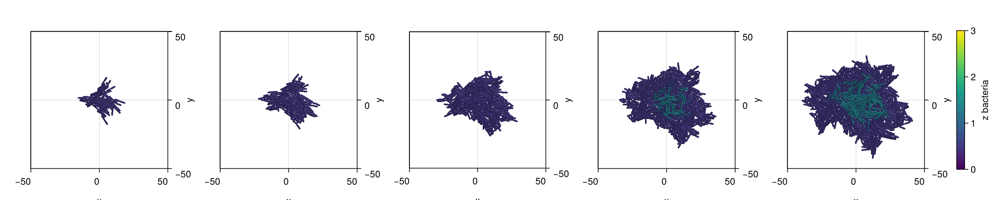

CairoMakie.Screen{IMAGE}


In [27]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= round.(Int, range(50, 92, length=5))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 3),
    colormap = :viridis
)

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = :viridis,
    colorrange =(0,3),
    label = "z bacteria"
)

save("NonPushing_z.png", fig; dpi=900)

display(fig)

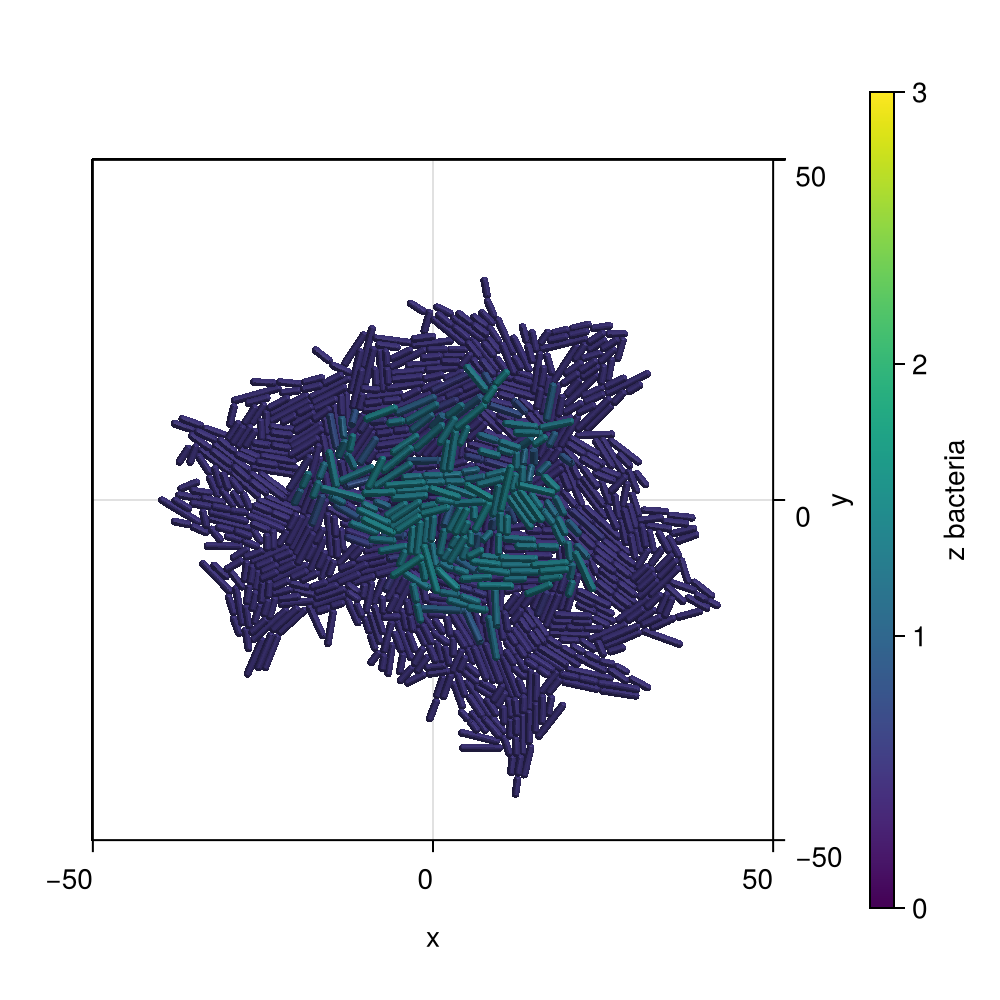

193


CairoMakie.Screen{IMAGE}


In [28]:
fig = Figure(size=(500,500))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= length(com_load)
for (i,j) in enumerate(js)
    println(i, j)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 3),
    colormap = :viridis
)

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = :viridis,
    colorrange =(0,3),
    label = "z bacteria"
)

display(fig)

In [29]:
maximum(com[:x])

41.150175448623

ERROR: LoadError: UndefVarError: `XYBased` not defined
Stacktrace:
 [1] getproperty(x::Module, f::Symbol)
   @ Base ./Base.jl:31
 [2] top-level scope
   @ ~/.julia/packages/Polynomials/13Ozz/ext/PolynomialsMakieExt.jl:6
 [3] include
   @ ./Base.jl:495 [inlined]
 [4] include_package_for_output(pkg::Base.PkgId, input::String, depot_path::Vector{String}, dl_load_path::Vector{String}, load_path::Vector{String}, concrete_deps::Vector{Pair{Base.PkgId, UInt128}}, source::String)
   @ Base ./loading.jl:2292
 [5] top-level scope
   @ stdin:4
in expression starting at /home/julia/.julia/packages/Polynomials/13Ozz/ext/PolynomialsMakieExt.jl:1
in expression starting at stdin:4
┌ Error: Error during loading of extension PolynomialsMakieExt of Polynomials, use `Base.retry_load_extensions()` to retry.
│   exception = 1-element ExceptionStack:
Failed to precompile PolynomialsMakieExt [6a4b1961-d857-5aa3-b7f6-fc7c46de29bb] to "/home/julia/.julia/compiled/v1.10/PolynomialsMakieExt/jl_wO5h6e".
Stacktrace

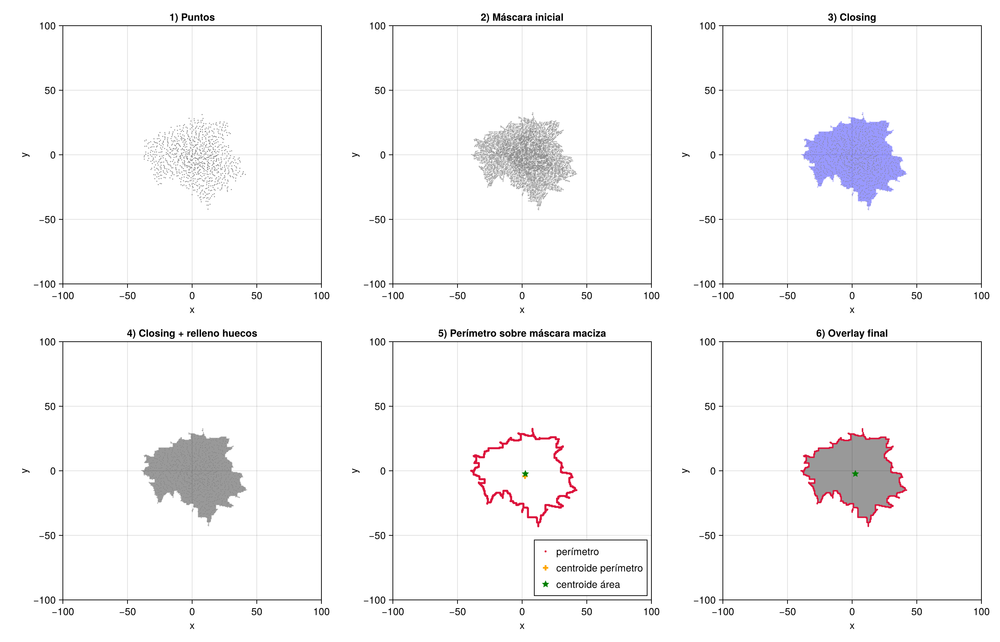

In [30]:
using CairoMakie: Axis
using Images, ImageMorphology
using Statistics

# ============================
# 1) Datos de entrada
# ============================
frame = com_load[end]   # o com_load[j] si quieres otro tiempo

xs = frame[:x]
ys = frame[:y]
ls = frame[:l]
ts = frame[:theta]
ps = frame[:phi]

# ============================
# 2) Parámetros de rasterización
# ============================
px = 0.5                     # tamaño de píxel en unidades de tu simulación
xmin, xmax = -100.0, 100.0
ymin, ymax = -100.0, 100.0

nx = Int(cld(xmax - xmin, px))
ny = Int(cld(ymax - ymin, px))

# Máscara binaria (filas ~ y, columnas ~ x)
mask = falses(ny, nx)

Δs_eff = 0.2 * px  # paso a lo largo del rod

for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
    ux = cos(theta) * cos(phi)   # dirección 2D
    uy = sin(theta) * cos(phi)

    K = max(2, ceil(Int, l / Δs_eff))
    for s in LinRange(-l/2, l/2, K)
        xp = x0 + s * ux
        yp = y0 + s * uy

        # mapeo a grid (x,y) -> (j,i)
        j = clamp(Int(floor((xp - xmin)/px)) + 2, 1, nx)  # columna (x)
        i = clamp(Int(floor((yp - ymin)/px)) + 2, 1, ny)  # fila    (y)

        mask[i, j] = true
    end
end

# ============================
# 3) Morfología: closing
# ============================
cell_diam = 1.0                          # en unidades de x,y
rpx = max(1, Int(round(cell_diam/px)))   # radio en píxeles
K = trues(2rpx+1, 2rpx+1)

dil  = dilate(mask, K)
clos = erode(dil, K)   # closing clásico

# ============================
# 4) Rellenar huecos internos
# ============================
function fill_holes(mask::BitMatrix)
    bg  = .!mask                    # fondo
    lbl = label_components(bg)      # etiquetas de fondo

    ny, nx = size(mask)
    border_labels = Set{Int}()

    # etiquetas de fondo que tocan el borde de la imagen
    union!(border_labels, lbl[1, :])
    union!(border_labels, lbl[end, :])
    union!(border_labels, lbl[:, 1])
    union!(border_labels, lbl[:, end])

    filled = copy(mask)

    @inbounds for i in 1:ny, j in 1:nx
        lab = lbl[i, j]
        if lab != 0 && !(lab in border_labels)
            filled[i, j] = true
        end
    end

    return filled
end


clos_filled = fill_holes(clos)

# perímetro sobre la máscara maciza
perim = clos_filled .& .!erode(clos_filled, trues(3,3))

# ============================
# 5) Centroides (área y perímetro)
# ============================
# Puntos del perímetro en coords reales
Iper = findall(perim)
@assert !isempty(Iper) "El perímetro está vacío; revisa px / límites / cell_diam"

pxx = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)  # columnas -> x
pyy = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)  # filas    -> y

# Centroide del perímetro
cx_perim = mean(pxx)
cy_perim = mean(pyy)

# Centroide del área (tipo regionprops sobre clos_filled)
Iarea = findall(clos_filled)
@assert !isempty(Iarea) "La máscara 'clos_filled' está vacía"

x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)
y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)
cx_area = mean(x_area)
cy_area = mean(y_area)

# ============================
# 6) Helpers de visualización
# ============================
to_rgba(mask_bool; fill_color = RGBA(0,0,0,0.5)) = begin
    img = fill(RGBA(0,0,0,0), size(mask_bool)...)
    img[mask_bool] .= fill_color
    img
end

img_mask        = to_rgba(mask;        fill_color = RGBA(0,0,0,0.4))
img_clos        = to_rgba(clos;        fill_color = RGBA(0,0,1,0.4))
img_clos_filled = to_rgba(clos_filled; fill_color = RGBA(0,0,0,0.4))
img_empty       = fill(RGBA(0,0,0,0), ny, nx)

# Makie interpreta (x,y) como (col, fila) → transponemos
img_mask_flip        = permutedims(img_mask)
img_clos_flip        = permutedims(img_clos)
img_clos_filled_flip = permutedims(img_clos_filled)
img_empty_flip       = permutedims(img_empty)

xstop = xmax
ystop = ymax

# ============================
# 7) Figura con los pasos
# ============================
fig = Figure(resolution = (1400, 900))

ax1 = Axis(fig[1,1], title = "1) Puntos", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax1, xmin..xstop, ymin..ystop, img_empty_flip)
scatter!(ax1, xs, ys; markersize=2, color=:gray)

ax2 = Axis(fig[1,2], title = "2) Máscara inicial", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax2, xmin..xstop, ymin..ystop, img_mask_flip)
scatter!(ax2, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax3 = Axis(fig[1,3], title = "3) Closing", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax3, xmin..xstop, ymin..ystop, img_clos_flip)
scatter!(ax3, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax4 = Axis(fig[2,1], title = "4) Closing + relleno huecos", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax4, xmin..xstop, ymin..ystop, img_clos_filled_flip)
scatter!(ax4, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax5 = Axis(fig[2,2], title = "5) Perímetro sobre máscara maciza", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax5, xmin..xstop, ymin..ystop, img_empty_flip)
scatter!(ax5, pxx, pyy; markersize=4, color=:crimson, label="perímetro")
scatter!(ax5, [cx_perim], [cy_perim]; markersize=10, color=:orange, marker=:cross, label="centroide perímetro")
scatter!(ax5, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5, label="centroide área")
axislegend(ax5; position=:rb)

ax6 = Axis(fig[2,3], title = "6) Overlay final", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax6, xmin..xstop, ymin..ystop, img_clos_filled_flip)
scatter!(ax6, pxx, pyy; markersize=3, color=:crimson)
scatter!(ax6, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5)

fig
# save("pipeline_colonia_filled.png", fig)


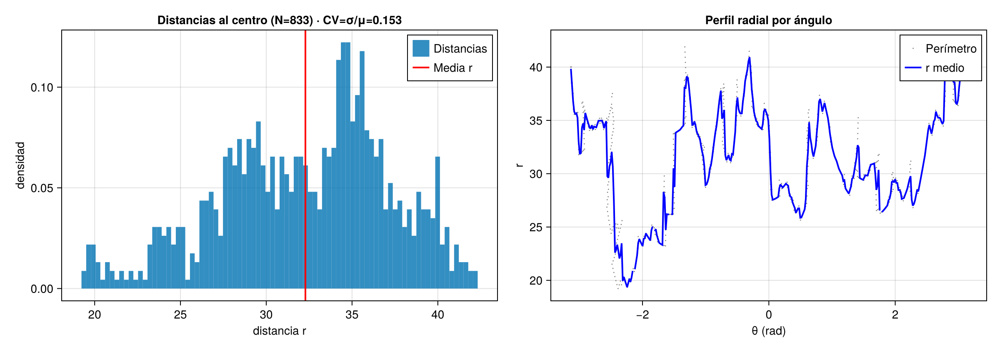

┌ Info: Radial asymmetry
│   mean = 32.28271802723675
│   std = 4.9386538657232775
│   CV_std_over_mean = 0.1529813524857654
│   CV_mean_over_std = 6.536744405453259
└ @ Main /home/julia/Escritorio/Projects/Pushing/ABM_CBM/proves/Pushing/Clean/nopushing/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X50sZmlsZQ==.jl:18
┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie /home/julia/.julia/packages/Makie/dpDAM/src/scenes.jl:238


Media r = 32.28271802723675
Std r   = 4.9386538657232775
CV (σ/μ) = 0.1529813524857654   ← estándar
CV (μ/σ) = 6.536744405453259   ← como lo planteaste


In [31]:
using Statistics
using CairoMakie: Axis
CairoMakie.activate!()   # solo una vez por sesión
# display(f_cv)
# --- elige el centroide ---
cx, cy = cx_area, cy_area   # o cx_perim, cy_perim

@assert !isempty(pxx) "No hay puntos de perímetro."

# Distancias euclídeas del perímetro al centro
d = hypot.(pxx .- cx, pyy .- cy)

μ = mean(d)
σ = std(d)
cv_std_over_mean = σ / μ
cv_mean_over_std = μ / σ

@info "Radial asymmetry" mean=μ std=σ CV_std_over_mean=cv_std_over_mean CV_mean_over_std=cv_mean_over_std

# ================================
# FIGURA DEL CV
# ================================
f_cv = Figure(resolution = (1200, 420))

# --- Histograma de distancias ---
axh = Axis(f_cv[1,1],
    title = "Distancias al centro (N=$(length(d))) · CV=σ/μ=$(round(cv_std_over_mean, digits=3))",
    xlabel = "distancia r",
    ylabel = "densidad"
)
hist!(axh, d; bins = max(20, cld(length(d),10)), normalization = :pdf, label="Distancias")
vlines!(axh, [μ]; color = :red, linewidth = 2, label="Media r")
axislegend(axh; position=:rt)

# --- Perfil angular ---
θ = atan.(pyy .- cy, pxx .- cx)

axp = Axis(f_cv[1,2],
    title = "Perfil radial por ángulo",
    xlabel = "θ (rad)",
    ylabel = "r",
)

scatter!(axp, θ, d; markersize = 2, color = :gray, label="Perímetro")

# ✅ cálculo de r medio por sectores angulares
nbinsθ = 360
edges = range(-π, π; length = nbinsθ+1)
θ_cent = similar(edges, nbinsθ)
r_mean = similar(edges, nbinsθ)

for k in 1:nbinsθ
    sel = (θ .>= edges[k]) .& (θ .< edges[k+1])
    vals = d[sel]
    r_mean[k] = isempty(vals) ? NaN : mean(vals)
    θ_cent[k] = (edges[k] + edges[k+1]) / 2
end

lines!(axp, θ_cent, r_mean; linewidth = 2, color = :blue, label="r medio")
axislegend(axp; position=:rt)

display(f_cv)

println("Media r = $μ")
println("Std r   = $σ")
println("CV (σ/μ) = $cv_std_over_mean   ← estándar")
println("CV (μ/σ) = $cv_mean_over_std   ← como lo planteaste")


In [32]:
using Images, ImageMorphology
using Statistics

# Rellena huecos internos de una máscara binaria
function fill_holes(mask::BitMatrix)
    bg  = .!mask                    # fondo
    lbl = label_components(bg)      # etiquetas de fondo

    ny, nx = size(mask)
    border_labels = Set{Int}()

    # etiquetas de fondo que tocan el borde de la imagen
    union!(border_labels, lbl[1, :])
    union!(border_labels, lbl[end, :])
    union!(border_labels, lbl[:, 1])
    union!(border_labels, lbl[:, end])

    filled = copy(mask)

    @inbounds for i in 1:ny, j in 1:nx
        lab = lbl[i, j]
        # agujero interno = fondo que no toca borde
        if lab != 0 && !(lab in border_labels)
            filled[i, j] = true
        end
    end

    return filled
end

"""
    colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                 cell_diam=2.0, sample_step=0.2)

Dado un `frame = com_load[j]` que contenga `:x, :y, :l, :theta, :phi`,
rasteriza los rods, calcula la máscara, su perímetro (sobre máscara sin huecos),
el centroide del área y el CV radial (σ/μ).

Retorna un NamedTuple con:
- perim_x::Vector{Float64}, perim_y::Vector{Float64}
- cx::Float64, cy::Float64
- cv::Float64, mu::Float64, sigma::Float64
- mask, clos, clos_filled, perim (por si quieres debug)
"""
function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                      cell_diam=2.0, sample_step=0.2)

    xs = frame[:x]; ys = frame[:y]
    ls = frame[:l]; ts = frame[:theta]; ps = frame[:phi]

    # ----- límites -----
    if bounds === nothing
        xmin = minimum(xs); xmax = maximum(xs)
        ymin = minimum(ys); ymax = maximum(ys)
        pad = max(3px, 3.0)
        xmin -= pad; xmax += pad; ymin -= pad; ymax += pad
    else
        xmin, xmax, ymin, ymax = bounds
    end
    nx = Int(cld(xmax - xmin, px))
    ny = Int(cld(ymax - ymin, px))

    # ----- rasterización a máscara -----
    mask = falses(ny, nx)           # (fila=y, col=x)
    Δs = sample_step * px

    for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
        ux = cos(theta) * cos(phi)
        uy = sin(theta) * cos(phi)  # proyección 2D
        K = max(2, ceil(Int, l / Δs))
        @inbounds for s in LinRange(-l/2, l/2, K)
            xp = x0 + s*ux
            yp = y0 + s*uy
            j = clamp(Int(floor((xp - xmin)/px)) + 1, 1, nx)  # columna (x)
            i = clamp(Int(floor((yp - ymin)/px)) + 1, 1, ny)  # fila (y)
            mask[i, j] = true
        end
    end

    # ----- morfología: closing + rellenar huecos -----
    rpx = max(1, Int(round(cell_diam/px/2)))
    K = trues(2rpx+1, 2rpx+1)
    dil  = dilate(mask, K)
    clos = erode(dil, K)                # closing
    clos_filled = fill_holes(clos)      # relleno de agujeros internos

    # perímetro sobre máscara maciza
    perim = clos_filled .& .!erode(clos_filled, trues(3,3))

    # ----- centroide del área (tipo regionprops sobre clos_filled) -----
    Iarea = findall(clos_filled)
    @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."
    x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)  # columnas -> x
    y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)  # filas    -> y
    cx = mean(x_area); cy = mean(y_area)

    # ----- perímetro en coordenadas -----
    Iper = findall(perim)
    @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."
    perim_x = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)
    perim_y = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)

    # ordenar perímetro por ángulo alrededor del centroide (para pintar línea suave)
    θ = atan.(perim_y .- cy, perim_x .- cx)
    ord = sortperm(θ)
    perim_x = perim_x[ord]
    perim_y = perim_y[ord]

    # ----- CV radial (σ/μ) -----
    d = hypot.(perim_x .- cx, perim_y .- cy)
    μ = mean(d); σ = std(d)
    cv = σ / μ

    return (perim_x=perim_x, perim_y=perim_y,
            cx=cx, cy=cy, cv=cv, mu=μ, sigma=σ,
            mask=mask, clos=clos, clos_filled=clos_filled, perim=perim,
            bounds=(xmin, xmax, ymin, ymax), px=px)
end


"""
    plot_colony_perimeter!(ax, res; show_points=false)

Pinta la periferia como línea, marca el centroide, y opcionalmente puntos del borde.
`res` es el NamedTuple devuelto por `colony_perimeter_centroid_cv`.
"""
function plot_colony_perimeter!(ax, res; show_points=false)
    scatter!(ax, res.perim_x, res.perim_y; color=:crimson, markersize=2, label="periferia")
    scatter!(ax, [res.cx], [res.cy]; color=:green, marker=:star5, markersize=12, label="centroide")
    if show_points
        scatter!(ax, res.perim_x, res.perim_y; color=:gray, markersize=2, label="borde (pts)")
    end
    axislegend(ax; position=:rb)
    return ax
end


plot_colony_perimeter!

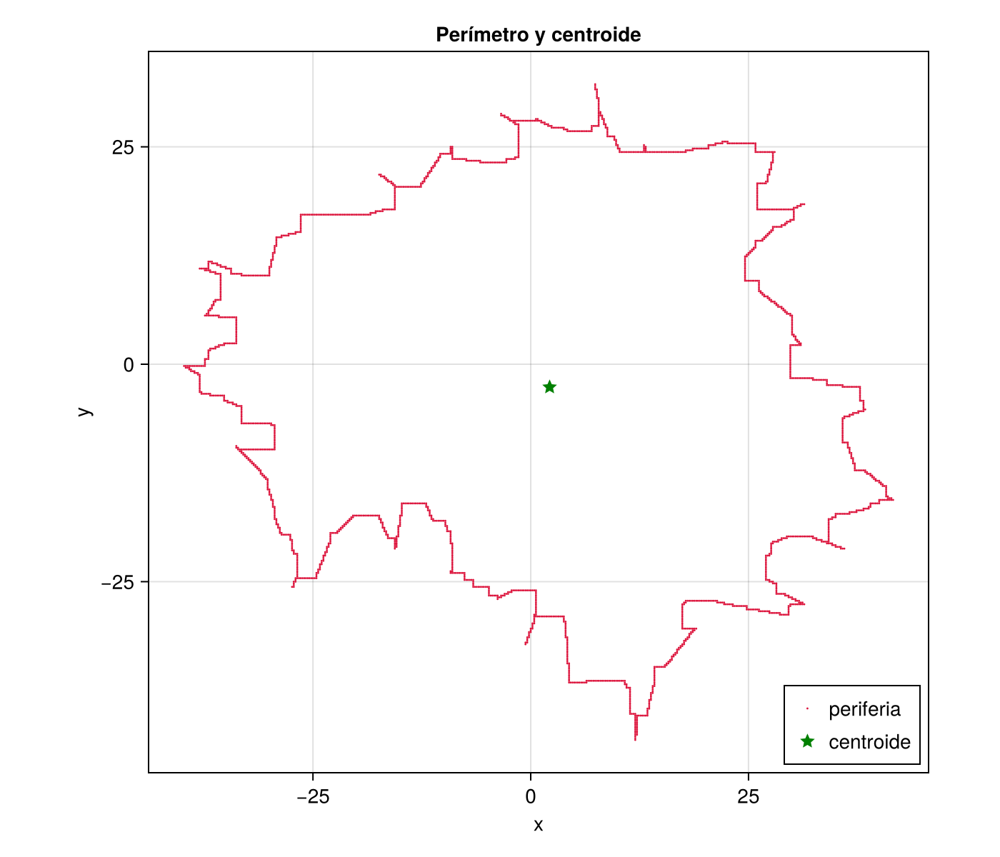

Centroide = (2.1689820617016737, -2.63174458496322)
CV radial (σ/μ) = 0.15238504521590265   (μ=32.37813276877626, σ=4.93394322597647)


┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie /home/julia/.julia/packages/Makie/dpDAM/src/scenes.jl:238


CairoMakie.Screen{IMAGE}


In [33]:
# ejemplo con el último frame:
res = colony_perimeter_centroid_cv(com_load[end]; px=0.2,
                                   bounds=(-100,100,-100,100),
                                   cell_diam=2.5, sample_step=0.01)

println("Centroide = ($(res.cx), $(res.cy))")
println("CV radial (σ/μ) = $(res.cv)   (μ=$(res.mu), σ=$(res.sigma))")

fig = Figure(resolution=(700,600))
ax  = Axis(fig[1,1]; title="Perímetro y centroide", xlabel="x", ylabel="y", aspect=DataAspect())
plot_colony_perimeter!(ax, res; show_points=false)
display(fig)
# save("colonia_perimetro.png", fig)


In [34]:
# fig = Figure(size=(3000,1500))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= round.(Int, range(1, length(com_load), length=5))
# ax  = Axis(fig[1,1]; title="Perímetro y centroide", xlabel="x", ylabel="y", aspect=DataAspect())
# ax2  = Axis(fig[1,2]; title="Perímetro y centroide", xlabel="x", ylabel="y", aspect=DataAspect())
# for (i,j) in enumerate(js)
#     # ejemplo con el último frame:
#     res = colony_perimeter_centroid_cv(com_load[j]; px=0.2,
#                                     bounds=(-100,100,-100,100),
#                                     cell_diam=2.5, sample_step=0.01)

#     println("Centroide = ($(res.cx), $(res.cy))")
#     println("CV radial (σ/μ) = $(res.cv)   (μ=$(res.mu), σ=$(res.sigma))")


#     scatter!(ax, res.perim_x, res.perim_y; color=:crimson, markersize=10, label="periferia")
#     scatter!(ax2, i, res.cv; color=:crimson, markersize=10, label="periferia")


# end
# display(fig)

In [35]:
length(com_load)

93

In [36]:
function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                      cell_diam=2.0, sample_step=0.2)

    xs = frame[:x]; ys = frame[:y]
    ls = frame[:l]; ts = frame[:theta]; ps = frame[:phi]

    # ----- límites -----
    if bounds === nothing
        xmin = minimum(xs); xmax = maximum(xs)
        ymin = minimum(ys); ymax = maximum(ys)
        pad = max(3px, 3.0)
        xmin -= pad; xmax += pad; ymin -= pad; ymax += pad
    else
        xmin, xmax, ymin, ymax = bounds
    end
    nx = Int(cld(xmax - xmin, px))
    ny = Int(cld(ymax - ymin, px))

    # ----- rasterización a máscara -----
    mask = falses(ny, nx)
    Δs = sample_step * px

    for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
        ux = cos(theta) * cos(phi)
        uy = sin(theta) * cos(phi)
        K = max(2, ceil(Int, l / Δs))
        @inbounds for s in LinRange(-l/2, l/2, K)
            xp = x0 + s*ux
            yp = y0 + s*uy
            j = clamp(Int(floor((xp - xmin)/px)) + 1, 1, nx)
            i = clamp(Int(floor((yp - ymin)/px)) + 1, 1, ny)
            mask[i, j] = true
        end
    end

    # ----- morfología: closing + rellenar huecos -----
    rpx = max(1, Int(round(cell_diam/px/2)))
    K = trues(2rpx+1, 2rpx+1)
    dil  = dilate(mask, K)
    clos = erode(dil, K)
    clos_filled = fill_holes(clos)

    # perímetro sobre máscara maciza
    perim = clos_filled .& .!erode(clos_filled, trues(3,3))

    # ----- centroide -----
    Iarea = findall(clos_filled)
    @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."
    x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)
    y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)
    cx = mean(x_area); cy = mean(y_area)

    # ----- perímetro en coordenadas -----
    Iper = findall(perim)
    @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."
    perim_x = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)
    perim_y = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)

    θ = atan.(perim_y .- cy, perim_x .- cx)
    ord = sortperm(θ)
    perim_x = perim_x[ord]
    perim_y = perim_y[ord]

    # ----- CV radial -----
    d = hypot.(perim_x .- cx, perim_y .- cy)
    μ = mean(d); σ = std(d)
    cv = σ / μ

    # ----- 🔥 área y densidad -----
    # área en píxeles de la colonia (máscara maciza)
    area_px = count(clos_filled)
    # área física (suponiendo px en μm) → μm²
    area_um2 = area_px * px^2

    # número de bacterias (elige lo que tenga sentido en tu frame)
    N = length(xs)   # o N = length(xs) si cada fila es una célula

    # densidad = N / área
    density = N / area_um2

    return (perim_x=perim_x, perim_y=perim_y,
            cx=cx, cy=cy, cv=cv, mu=μ, sigma=σ,
            mask=mask, clos=clos, clos_filled=clos_filled, perim=perim,
            bounds=(xmin, xmax, ymin, ymax), px=px,
            area_px=area_px, area_um2=area_um2,
            N=N, density=density)
end


colony_perimeter_centroid_cv (generic function with 1 method)

In [37]:
com_load[2][:x]

3-element Vector{Any}:
 -0.049626543176019056
  2.1813377704548547
 -0.04962706955252974

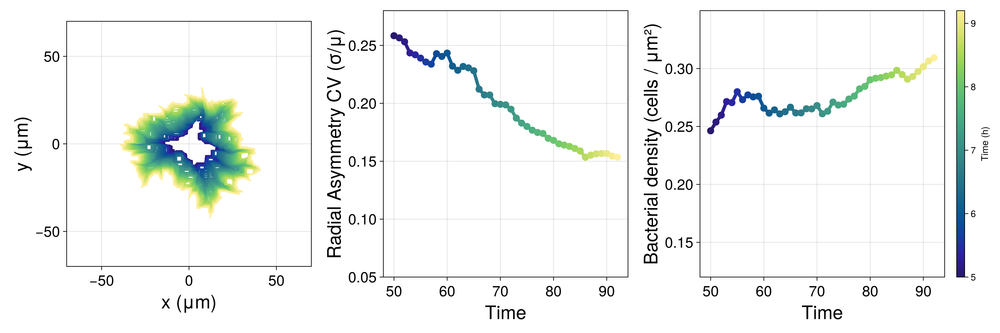

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie /home/julia/.julia/packages/Makie/dpDAM/src/scenes.jl:238


CairoMakie.Screen{IMAGE}


In [38]:
using CairoMakie

fig = Figure(resolution = (1500, 500))
com_load, times = load_parameters_log(file)

# selecciona 5 frames representativos
js = round.(Int, range(50, 92, length = 30))
js = round.(Int, range(50, 92))

ax1 = Axis(fig[1, 1];
    xlabel = "x (μm)",
    ylabel = "y (μm)",
    aspect = DataAspect(),
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

ax2 = Axis(fig[1, 2];
    xlabel = "Time",
    ylabel = "Radial Asymmetry CV (σ/μ)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

ax3 = Axis(fig[1, 3];
    xlabel = "Time",
    ylabel = "Bacterial density (cells / μm²)",
        xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

# axislegend(ax1; position = :rt)
limits!(ax1, -70, 70, -70, 70)  # xmin, xmax, ymin, ymax
limits!(ax2,  48, 94, 0.05, 0.28)  # xmin, xmax, ymin, ymax
limits!(ax3,  48, 94, 0.12, 0.35)  # xmin, xmax, ymin, ymax

# ✅ nuevo método
cols = resample_cmap(:haline, length(js))
cvs = Float64[]
densities = Float64[]

for (i, j) in enumerate(js)
    res = colony_perimeter_centroid_cv(
        com_load[j];
        px = 0.2,
        bounds = (-100, 100, -100, 100),
        cell_diam = 2.5,
        sample_step = 0.01
    )


    push!(cvs, res.cv)
    push!(densities, res.density)



    # periferia en XY
    scatter!(ax1, res.perim_x, res.perim_y;
           color = cols[i], markersize = 3,
           label = "frame $i")

    # scatter!(ax1, [res.cx], [res.cy];
    #          color = cols[i], markersize = 10)
end



scatterlines!(ax3, js, densities;
    color = cols, linewidth = 5, markersize = 15
)


# CV vs snapshot
scatterlines!(ax2, js, cvs;
              color = cols, linewidth = 5, markersize = 15)


Colorbar(fig[1, 4]; colormap = :haline, limits = (js[1]/10, js[end]/10), label = "Time (h)")
save("NonPushing_anal.svg", fig)
display(fig)


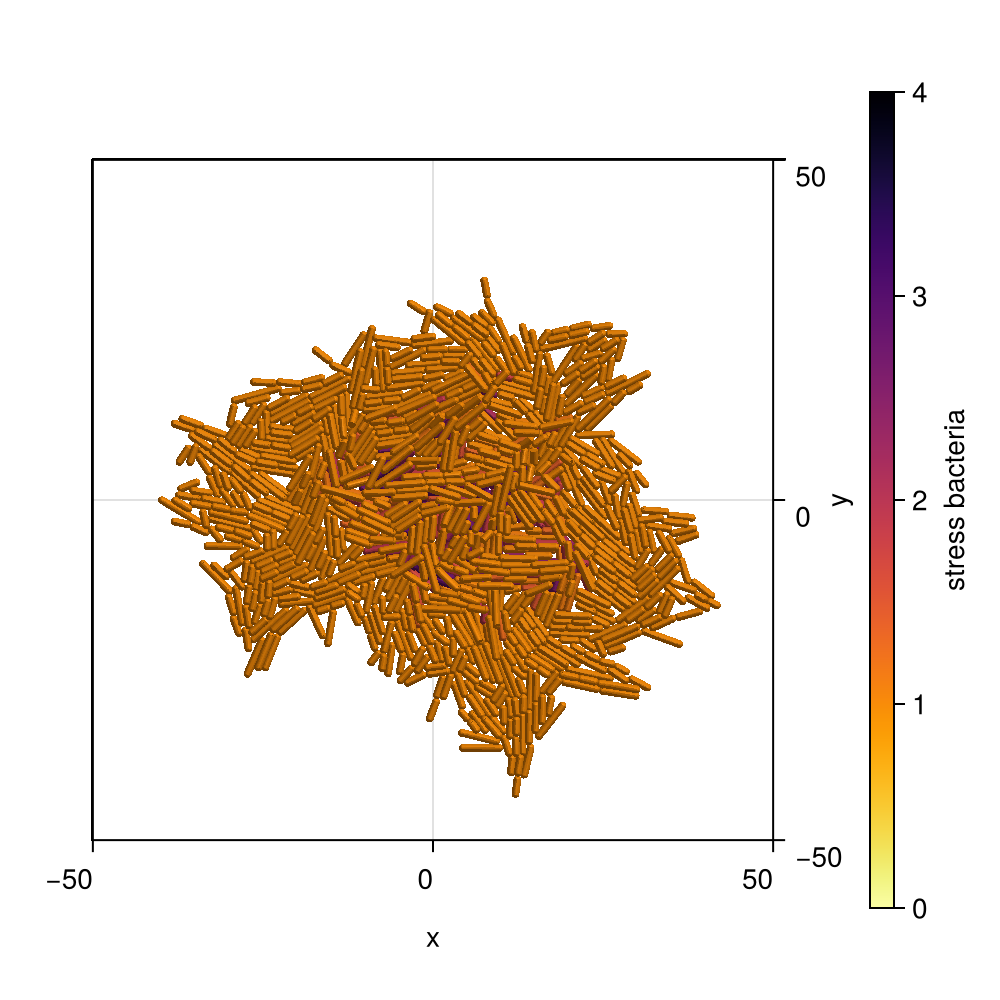

193


CairoMakie.Screen{IMAGE}


In [39]:
fig = Figure(size=(500,500))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= length(com_load)
for (i,j) in enumerate(js)
    println(i, j)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:V],
    colorrange = (0, 4),
    colormap = Reverse(:inferno)
)

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange =(0,4),
    label = "stress bacteria"
)

display(fig)

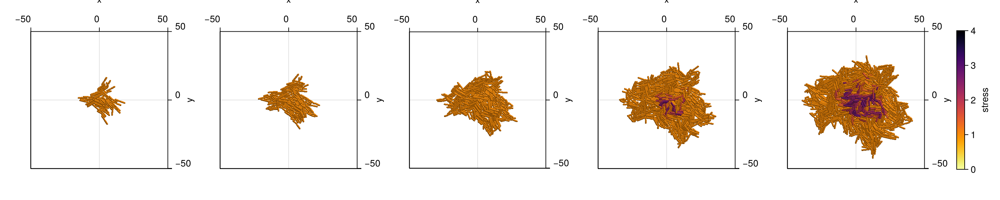

CairoMakie.Screen{IMAGE}


In [40]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= round.(Int, range(50, 92, length=5))
for (i,j) in enumerate(js)

    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:V],
    colorrange = (0, 4),
    colormap = Reverse(:inferno)
)

    xlims!(-50,50)
    ylims!(50,-50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange =(0,4),
    label = "stress"
)

save("NonPushing_V.png", fig; dpi=1500)
display(fig)

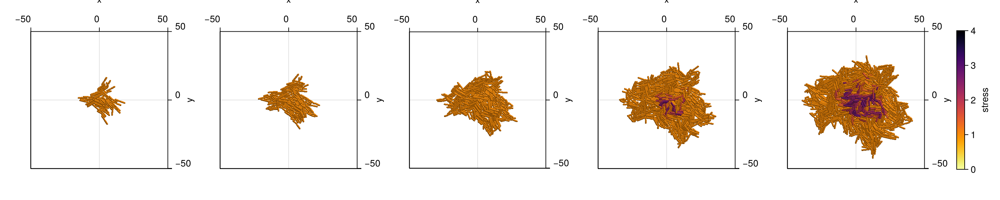

CairoMakie.Screen{IMAGE}


In [41]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= round.(Int, range(50, 92, length=5))
for (i,j) in enumerate(js)

    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:V],
    colorrange = (0, 4),
    colormap = Reverse(:inferno)
)

    xlims!(-50,50)
    ylims!(50,-50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange =(0,4),
    label = "stress"
)

display(fig)

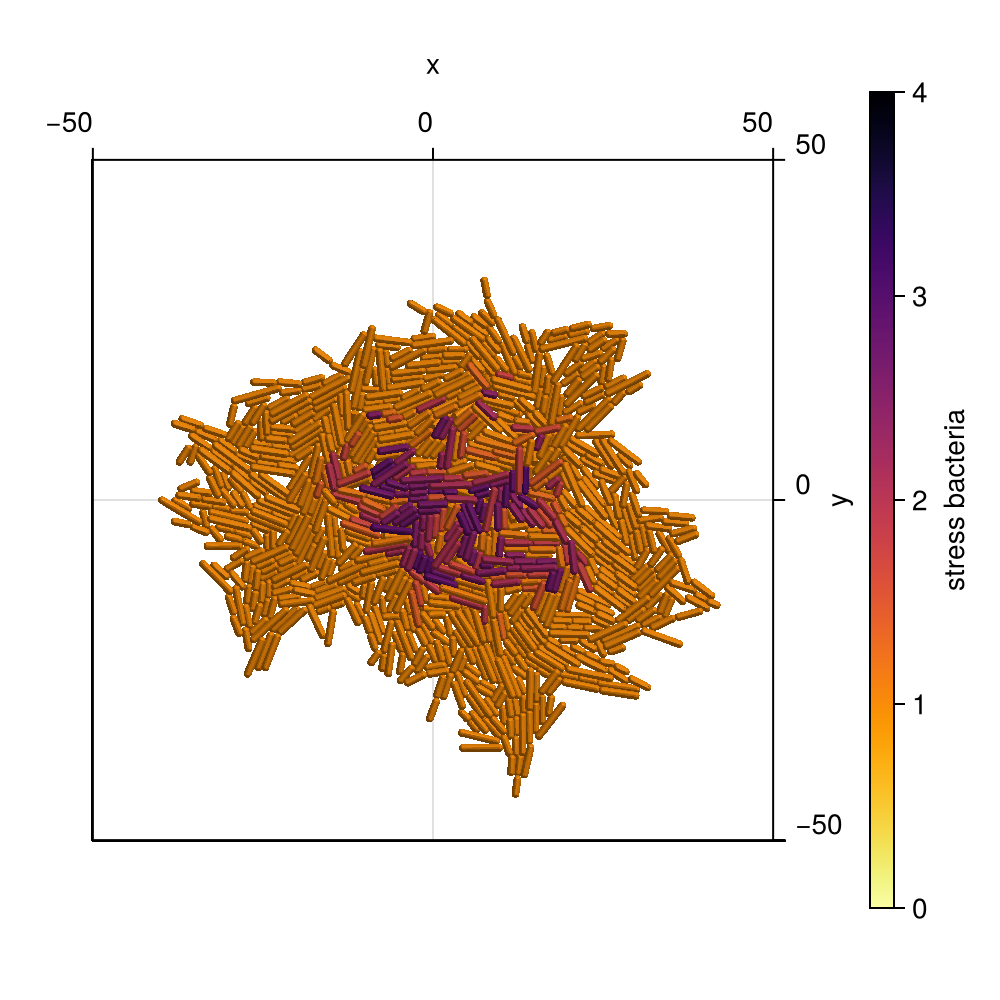

193


CairoMakie.Screen{IMAGE}


In [42]:
fig = Figure(size=(500,500))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= length(com_load)
for (i,j) in enumerate(js)
    println(i, j)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:V],
    colorrange = (0, 4),
    colormap = Reverse(:inferno)
)

    xlims!(-50,50)
    ylims!(50,-50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange =(0,4),
    label = "stress bacteria"
)

display(fig)

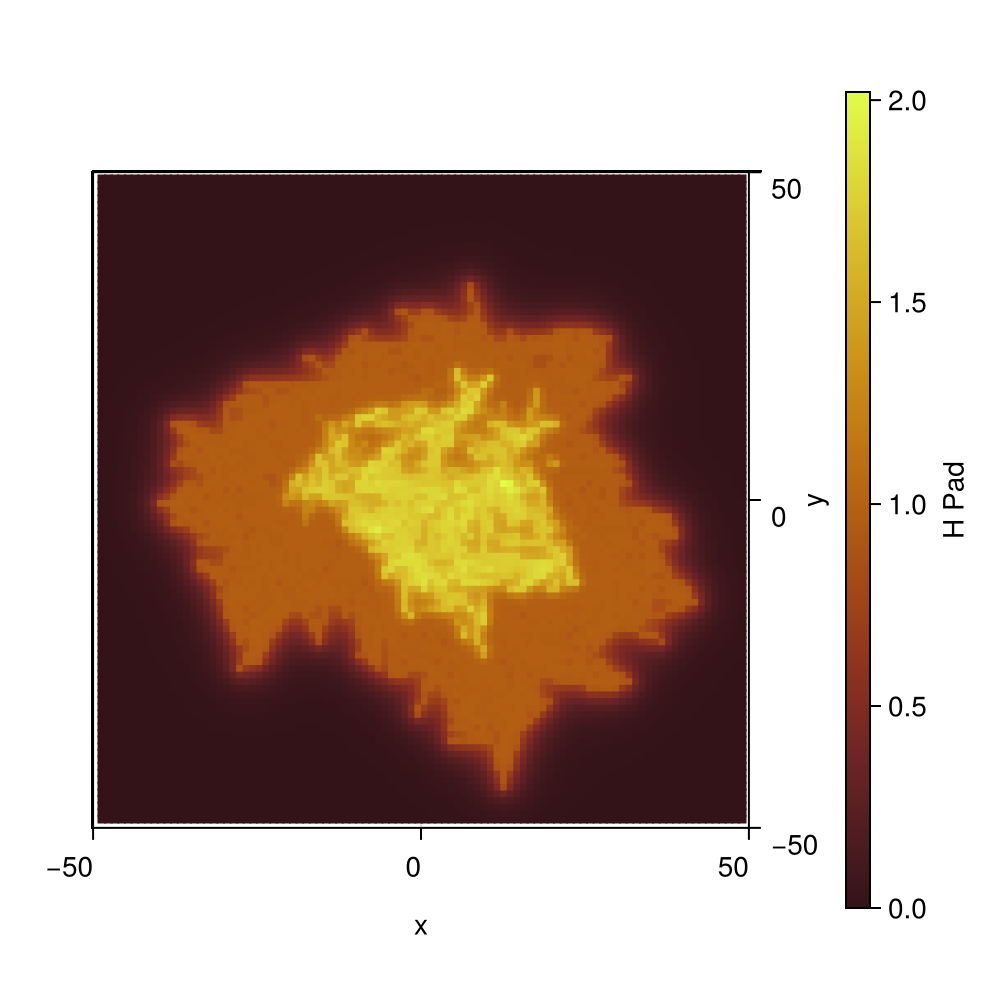

CairoMakie.Screen{IMAGE}


In [43]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:HPad]), com_load)))
colorrange_c = (0.0,  maximum(com.HPad))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.HPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.HPad)[2]),
            Float64.(hcat(com_load[j][:HPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "H Pad"
)
display(fig)

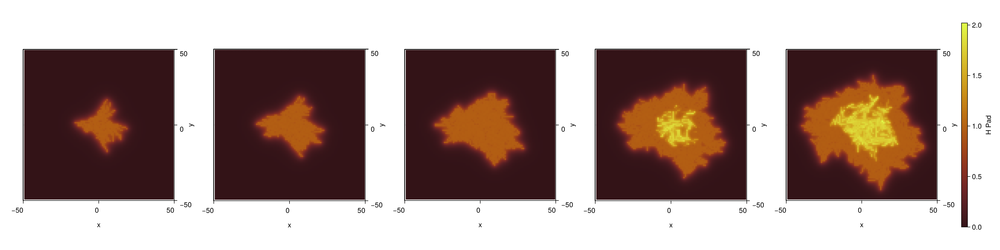

CairoMakie.Screen{IMAGE}


In [44]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:HPad]), com_load)))
# colorrange_c = (0.0,  maximum(maximum(maximum(p -> maximum(p[:HPad]), com_load))))
colorrange_c = (0.0,  maximum(com.HPad))

fig = Figure(size=(2000,500))

js= round.(Int, range(50, 92, length=5))

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.HPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.HPad)[2]),
            Float64.(hcat(com_load[j][:HPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "H Pad"
)
display(fig)

In [46]:
maximum(com.HPad)

2.0200631546227723

In [47]:
maximum(com.z)+com.d[1]/2

1.8974261260426621

In [48]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:summer
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrC)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrC)[2]),
            Float64.(hcat(com_load[j][:PhrC][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrC"
)
display(fig)

KeyError: KeyError: key :PhrC not found

In [49]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:summer
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrC)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrC)[2]),
            Float64.(hcat(com_load[j][:PhrC][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrC"
)
display(fig)

KeyError: KeyError: key :PhrC not found

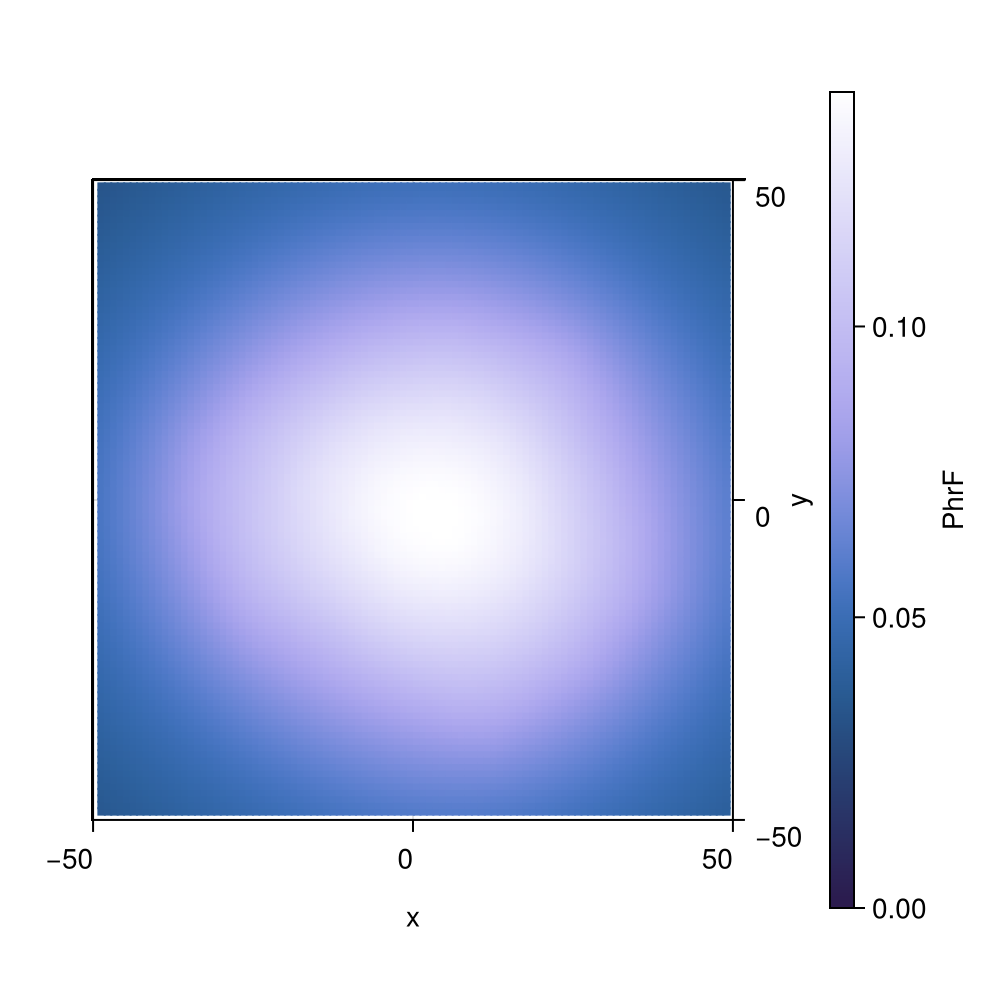

CairoMakie.Screen{IMAGE}


In [50]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:devon
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrF)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrF)[2]),
            Float64.(hcat(com_load[j][:PhrF][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrF"
)
display(fig)

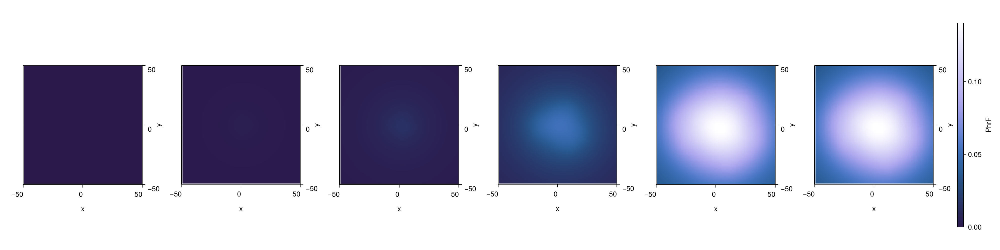

CairoMakie.Screen{IMAGE}


In [51]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:devon
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrF)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrF)[2]),
            Float64.(hcat(com_load[j][:PhrF][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrF"
)
display(fig)

In [52]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:blues
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[2]),
            Float64.(hcat(com_load[j][:PGA][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [54]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:blues
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA][1]), com_load)))

fig = Figure(size=(2000,500))

js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[2]),
            Float64.(hcat(com_load[j][:PGA][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [55]:
maximum(maximum((maximum(p -> maximum(p[:PGA]), com_load))))

0.0

In [56]:
maximum(maximum((maximum(p -> maximum(p[:PPad]), com_load))))

2.045741152338225e6

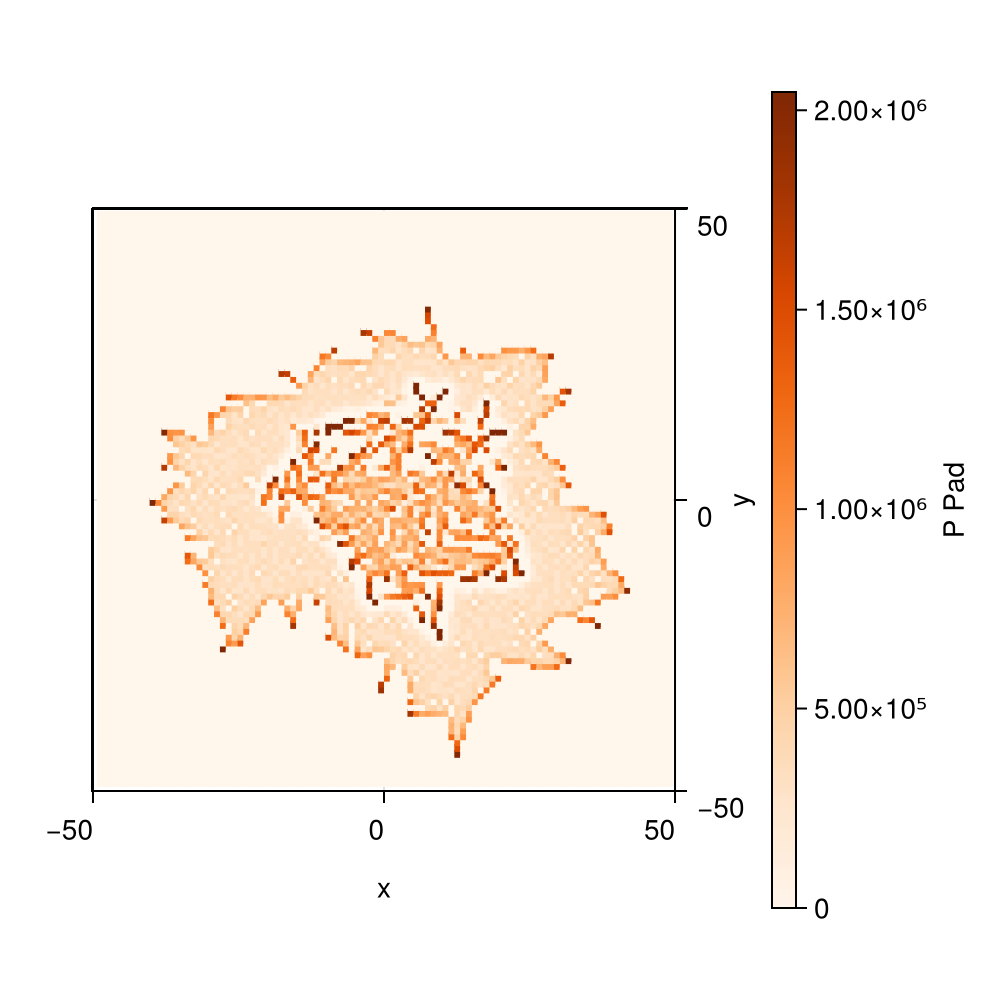

CairoMakie.Screen{IMAGE}


In [58]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PPad]), com_load)))
colorrange_c = (-0.1,  maximum(maximum(p -> maximum(p[:PPad][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PPad)[2]),
            Float64.(hcat(com_load[j][:PPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "P Pad"
)
display(fig)

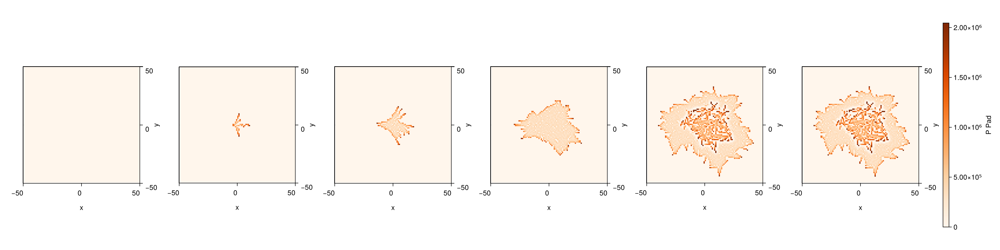

CairoMakie.Screen{IMAGE}


In [59]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PPad]), com_load)))
colorrange_c = (-0.1,  maximum(maximum(p -> maximum(p[:PPad][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PPad)[2]),
            Float64.(hcat(com_load[j][:PPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "P Pad"
)
display(fig)

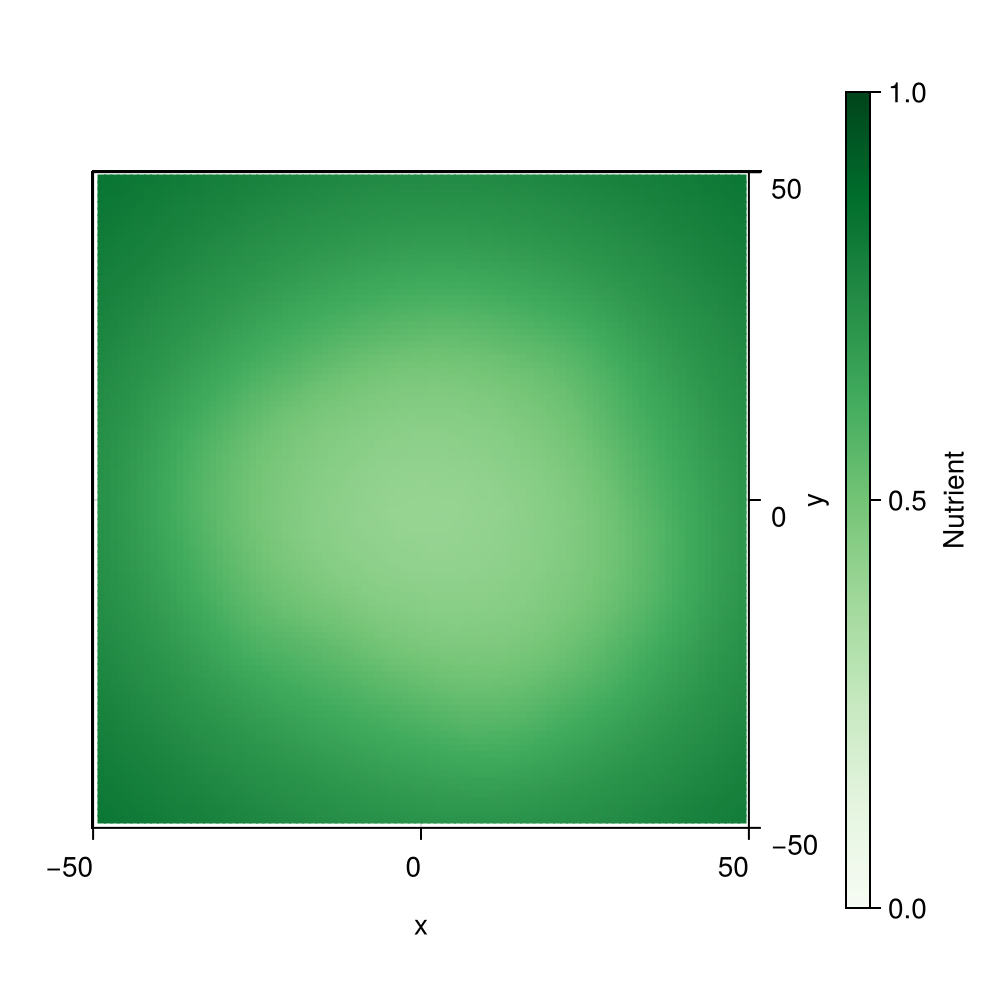

CairoMakie.Screen{IMAGE}


In [60]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Greens
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
colorrange_c = (0,  maximum(maximum(p -> maximum(p[:c][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[2]),
            Float64.(hcat(com_load[j][:c][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "Nutrient"
)
display(fig)

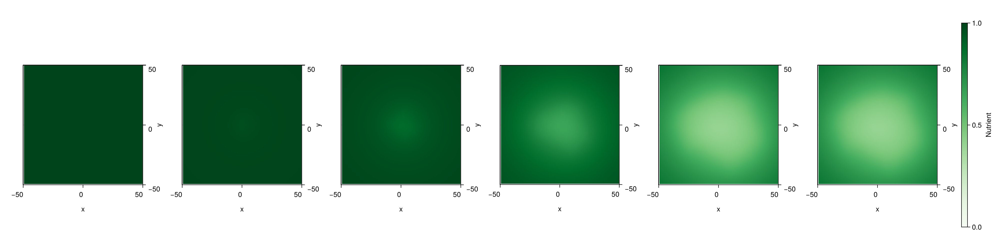

CairoMakie.Screen{IMAGE}


In [61]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Greens
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
colorrange_c = (0,  maximum(maximum(p -> maximum(p[:c][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[2]),
            Float64.(hcat(com_load[j][:c][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "Nutrient"
)
display(fig)

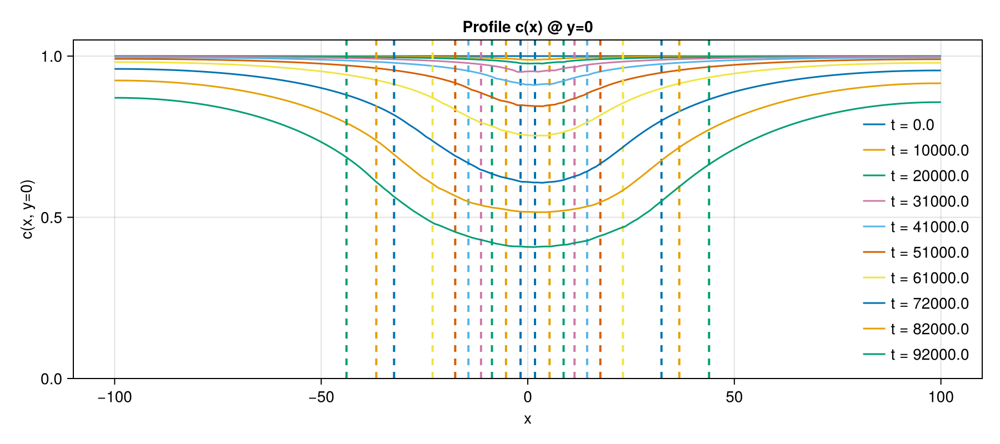

CairoMakie.Screen{IMAGE}


In [62]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.c)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:c][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [63]:
com.gamma_c[1]

5.0

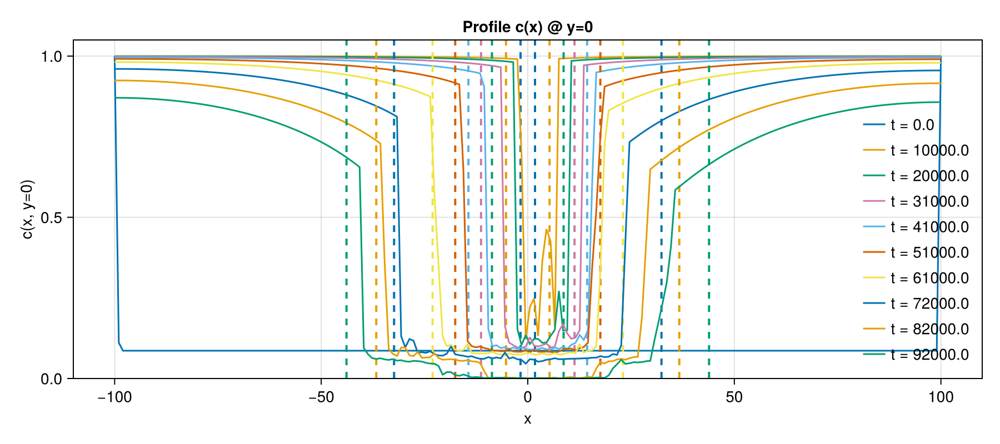

CairoMakie.Screen{IMAGE}


In [64]:
fig_line = Figure(size=(900, 400))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.c)[1]))

# índice de columna que quieres
y_idx = 100

for (i, j) in enumerate(js)
    # matrices en la misma malla
    C = Float64.(hcat(com_load[j][:c][1]...))
    H = Float64.(hcat(com_load[j][:HPad][1]...))

    # perfiles a lo largo de x en y = y_idx
    cx = @view C[:, y_idx]
    hx = @view H[:, y_idx]

    # aplicar el factor exp(-gamma*(h - d/2)) y CAPAR por arriba en 1
    # (si prefieres también capar por abajo a 0: usa clamp.(..., 0, 1))
    cx_eff = @. cx *min(exp(-com.gamma_c[1]*(hx - com.d[1]/2)), 1)

    # traza el perfil modificado y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx_eff, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales con el mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [65]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrC(x, y=0)", title="Profile PhrC(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrC)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrC][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


ErrorException: Parameter PhrC not found in the community.

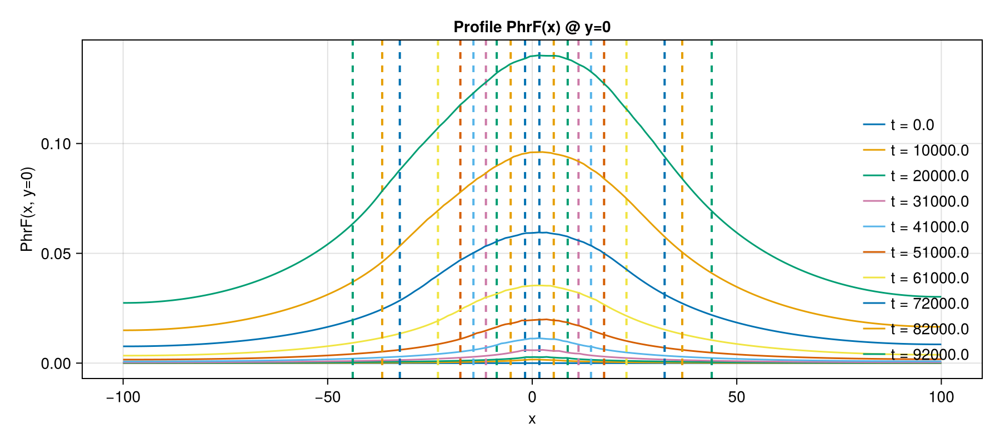

CairoMakie.Screen{IMAGE}


In [66]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF(x, y=0)", title="Profile PhrF(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrF][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


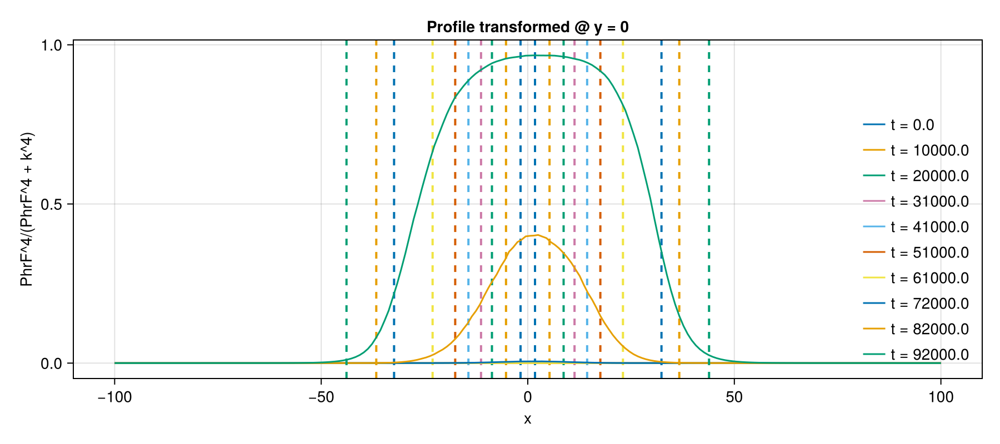

CairoMakie.Screen{IMAGE}


In [67]:
k = 0.1   # ajusta el valor que te interese
nk = 10   # ajusta el valor que te interese

fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF^4/(PhrF^4 + k^4)",
           title="Profile transformed @ y = 0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración original
    C = Float64.(hcat(com_load[j][:PhrF][1]...))

    # transforma cada punto a PhrF^4/(PhrF^4 + k^4)
    Ctrans = @. C^nk / (C^nk + k^nk)

    # saca el perfil en y = 100
    cx = @view Ctrans[:, 100]

    # dibuja el perfil
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


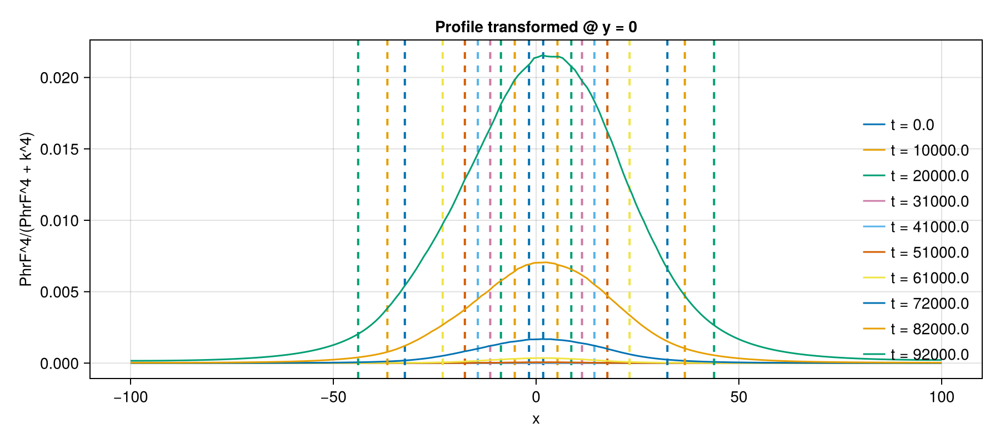

CairoMakie.Screen{IMAGE}


In [68]:
k = 0.5   # ajusta el valor que te interese
nk = 3   # ajusta el valor que te interese

fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF^4/(PhrF^4 + k^4)",
           title="Profile transformed @ y = 0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración original
    C = Float64.(hcat(com_load[j][:PhrF][1]...))

    # transforma cada punto a PhrF^4/(PhrF^4 + k^4)
    Ctrans = @. C^nk / (C^nk + k^nk)

    # saca el perfil en y = 100
    cx = @view Ctrans[:, 100]

    # dibuja el perfil
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


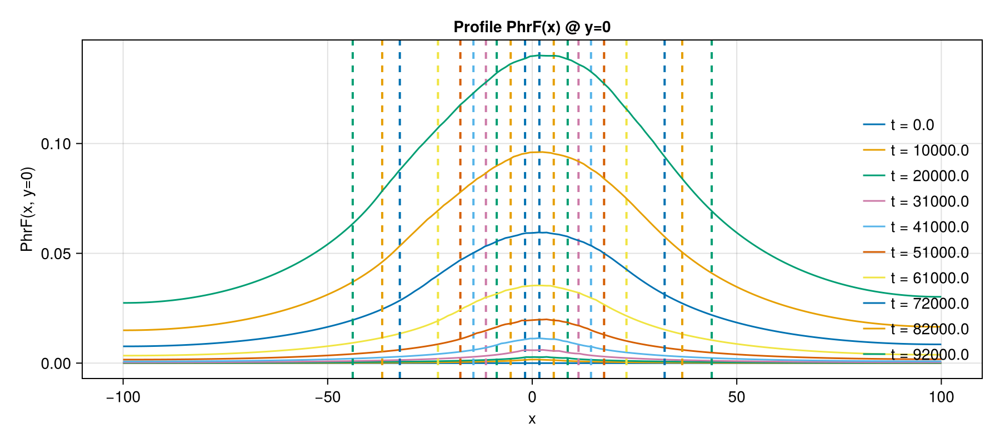

CairoMakie.Screen{IMAGE}


In [69]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF(x, y=0)", title="Profile PhrF(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrF][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


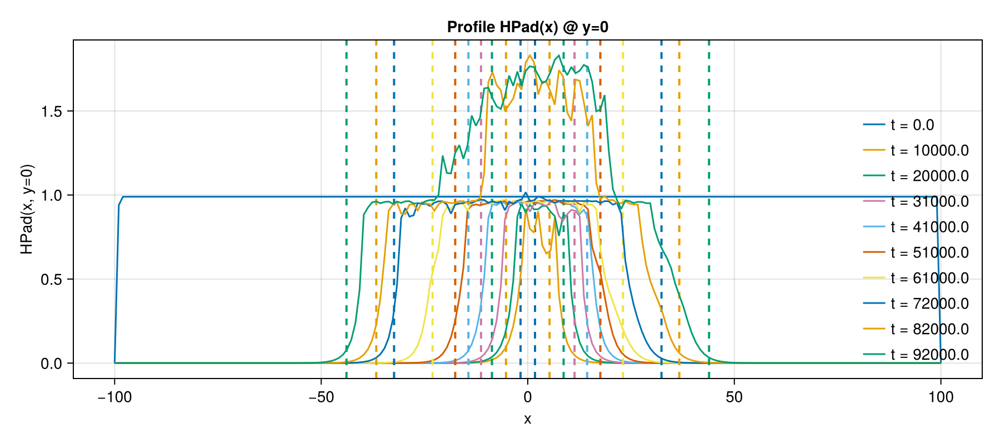

CairoMakie.Screen{IMAGE}


In [70]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="HPad(x, y=0)", title="Profile HPad(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.HPad)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:HPad][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [71]:
maximum(com.z)

1.3974261260426621

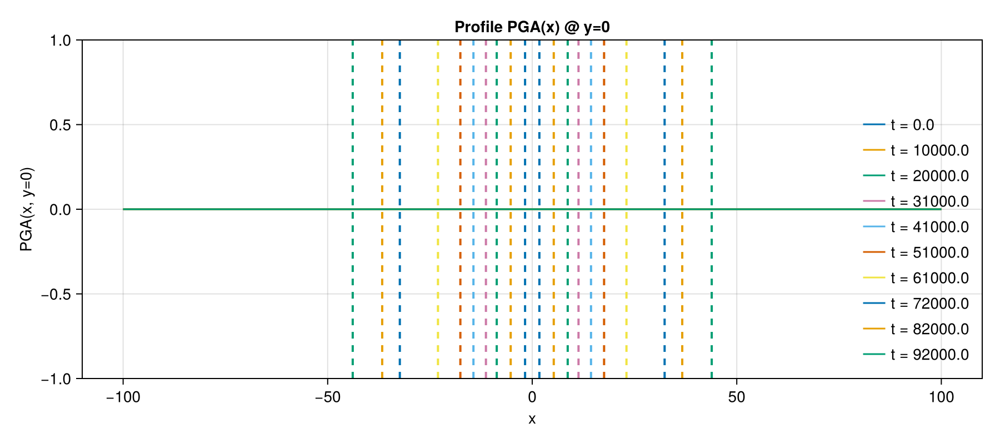

CairoMakie.Screen{IMAGE}


In [72]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PGA(x, y=0)", title="Profile PGA(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PGA)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PGA][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [73]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.1))
ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1, 2],
    colormap = :viridis,
    colorrange =(0,3),
    label = "z bacteria"
)

Makie.record(fig, "Colony_z.mp4", 1:2:Int(length(com_load)); framerate = 10) do j
 
    Makie.empty!(ax1)

    plotAgents3D_auto!(
    ax1,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 3),
    colormap = :viridis,
)

    xlims!(ax1,-100,100)
    ylims!(ax1,-100,100)
    zlims!(ax1,-2,8)

end




"Colony_z.mp4"

In [74]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] 
ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.1))
ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2],
    colormap = Reverse(:inferno),
    colorrange =(0,4),
    label = "Stress"
)

Makie.record(fig, "Colony_V.mp4", 1:2:Int(length(com_load)); framerate = 10) do j
 
    Makie.empty!(ax1)

    plotAgents3D_auto!(
    ax1,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:V],
    colorrange = (0, 4),
    colormap = Reverse(:inferno),
)


    xlims!(ax1,-100,100)
    ylims!(ax1,100,-100)
    zlims!(ax1,-2,8)

end


"Colony_V.mp4"